# Predictive Sales Analysis with Regression Models

## Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly_express as px
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn import metrics

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

## Loading the dataset

In [2]:
sales_df = pd.read_csv('bigmart-sales-train.csv')

#Looking into the first few rows of the dataframe
sales_df.head(6)

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.300,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.920,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.500,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.200,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.930,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052
5,FDP36,10.395,Regular,0.000000,Baking Goods,51.4008,OUT018,2009,Medium,Tier 3,Supermarket Type2,556.6088


## Initial Data Exploring

In [3]:
sales_df.shape

(8523, 12)

In [4]:
sales_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


In [5]:
sales_df.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,7060.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.643456,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,8.773750,0.026989,93.826500,1987.000000,834.247400
50%,12.600000,0.053931,143.012800,1999.000000,1794.331000
75%,16.850000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


In [6]:
# Ploting a histogram of the Item_Outlet_Sales column
fig = px.histogram(sales_df, x="Item_Outlet_Sales", title="Outlet Sales Histogram")
fig.show()

In [7]:
# A scatter plot of the Item_MRP and Item_Outlet_Sales columns
# This shows how Item MRP impacts Sales with detailed distribution within each level 
fig = px.scatter(sales_df, x="Item_MRP", y="Item_Outlet_Sales")
fig.show()

In [8]:
# Outlet_Size vs Outlet_Location_Type
# Showing the impact of Location type on Outlet Size
fig = px.scatter(sales_df, x="Outlet_Size", y="Outlet_Location_Type", color="Outlet_Size", title="Outlet Size vs. Location Type")
fig.show()

In [9]:
# Item Type vs Fat Content impacts
#Categorical scatter plot of Item_Type and Item_Fat_Content
fig = px.scatter(sales_df, x="Item_Type", y="Item_Fat_Content", color="Item_Type", title="Item Type vs. Fat Content")
fig.show()

In [10]:
# Create a scatter plot of Outlet_Size and Item_Outlet_Sales
fig = px.scatter(sales_df, x="Outlet_Size", y="Item_Outlet_Sales", color="Outlet_Size", title="Outlet Size vs. Sales")
fig.show()

In [11]:

# Create a scatter plot of Item_Outlet_Sales vs Item_Weight
fig = px.scatter(sales_df, x='Item_Outlet_Sales', y='Item_Weight', title='Item Weight vs Sales')
fig.show()

In [12]:

# Create a scatter plot of Item_Outlet_Sales vs Item_Visibility
fig = px.scatter(sales_df, x='Item_Visibility', y='Item_Outlet_Sales', title='Item Visibility vs Sales')
fig.show()

In [13]:

# Create a scatter plot of Item_Outlet_Sales vs Outlet_Type
fig = px.scatter(sales_df, x='Outlet_Type', y='Item_Outlet_Sales', title='Outlet Type vs Sales')
fig.show()

## Data Preprocessing

Item_Identifier              1559
Item_Weight                   415
Item_Fat_Content                5
Item_Visibility              7880
Item_Type                      16
Item_MRP                     5938
Outlet_Identifier              10
Outlet_Establishment_Year       9
Outlet_Size                     3
Outlet_Location_Type            3
Outlet_Type                     4
Item_Outlet_Sales            3493
dtype: int64


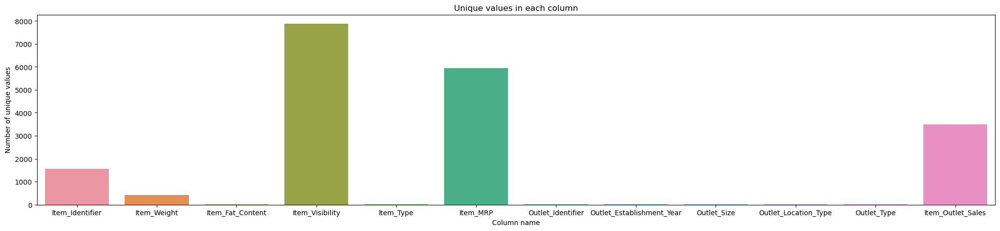

In [14]:
# Check the unique values in each column
unique_values = sales_df.apply(pd.Series.nunique)
print(unique_values)

# Plot bar graph to visualize all the unique values
plt.figure(figsize=(25, 5))
sns.barplot(x=unique_values.index, y=unique_values.values)

plt.xlabel('Column name')
plt.ylabel('Number of unique values')
plt.title('Unique values in each column')
plt.show()

In [15]:
# Print the unique values of each column
sales_df.apply(lambda x: x.unique())

Item_Identifier              [FDA15, DRC01, FDN15, FDX07, NCD19, FDP36, FDO...
Item_Weight                  [9.3, 5.92, 17.5, 19.2, 8.93, 10.395, 13.65, n...
Item_Fat_Content                          [Low Fat, Regular, low fat, LF, reg]
Item_Visibility              [0.016047301, 0.019278216, 0.016760075, 0.0, 0...
Item_Type                    [Dairy, Soft Drinks, Meat, Fruits and Vegetabl...
Item_MRP                     [249.8092, 48.2692, 141.618, 182.095, 53.8614,...
Outlet_Identifier            [OUT049, OUT018, OUT010, OUT013, OUT027, OUT04...
Outlet_Establishment_Year    [1999, 2009, 1998, 1987, 1985, 2002, 2007, 199...
Outlet_Size                                         [Medium, nan, High, Small]
Outlet_Location_Type                                  [Tier 1, Tier 3, Tier 2]
Outlet_Type                  [Supermarket Type1, Supermarket Type2, Grocery...
Item_Outlet_Sales            [3735.138, 443.4228, 2097.27, 732.38, 994.7052...
dtype: object

In [16]:
#looking into the unique values of Item Type
sales_df.Item_Type.unique()

array(['Dairy', 'Soft Drinks', 'Meat', 'Fruits and Vegetables',
       'Household', 'Baking Goods', 'Snack Foods', 'Frozen Foods',
       'Breakfast', 'Health and Hygiene', 'Hard Drinks', 'Canned',
       'Breads', 'Starchy Foods', 'Others', 'Seafood'], dtype=object)

### Specific Variable Cleaning and Imputations.

In [17]:
# Remove rows with "Others" in the Item_Type column
sales_df = sales_df.loc[~sales_df["Item_Type"].isin(["Others"])]

In [18]:
#Checking for missing vales in the dataset
print(sales_df.isna().sum()) #counts the number of missing values in each column

Item_Identifier                 0
Item_Weight                  1431
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2364
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64


In [19]:
# Calculate the mean of the "Item_Weight" column
mean_weight = sales_df["Item_Weight"].mean()

# Fill the missing values with the mean
sales_df["Item_Weight"].fillna(mean_weight, inplace=True)

In [20]:
# Calculate the mode of the "Outlet_Size" column
mode_outletsize = sales_df["Outlet_Size"].mode()[0]

# Fill the missing values with the mode
sales_df["Outlet_Size"].update(sales_df["Outlet_Size"].fillna(mode_outletsize))

In [21]:
sales_df.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
Item_Outlet_Sales            0
dtype: int64

In [22]:
# Create a scatter plot with subplots for each outlet size
fig = px.scatter(sales_df, x="Item_MRP", y="Item_Outlet_Sales", facet_col="Outlet_Size", title="Item MRP vs. Outlet Sales by Outlet Size")
fig.show()

In [23]:
# Create a scatter plot with subplots for each outlet type
fig = px.scatter(sales_df, x="Item_MRP", y="Item_Outlet_Sales", facet_col="Outlet_Type", title="Item MRP vs. Outlet Sales by Outlet Type")
fig.show()

### Understanding the variables better by small encoding of specific values.

In [24]:
# Group the data by Outlet_Identifier and sum the Item_Outlet_Sales values
outlet_sales = sales_df.groupby("Outlet_Identifier")["Item_Outlet_Sales"].sum()

# Convert the outlet sales series to a DataFrame with a column for Outlet_Identifier
outlet_sales_df = outlet_sales.reset_index(name="Outlet_Sales")

# Create a bar chart of Outlet_Identifier and Outlet_Sales
fig = px.bar(outlet_sales_df, x="Outlet_Identifier", y="Outlet_Sales", color="Outlet_Identifier", title="Outlet Sales by Outlet")
fig.show()

In [25]:
#Creating a new item type with the help of Item_Identifier Column that has the 
#first two letters to identify products as different categories.
new_item_type = []

#Each value in Item Identifier's firts two letters represents type of item.
for item in sales_df['Item_Identifier']:
  # Append the first two characters to the list
  new_item_type.append(item[:2])

sales_df['New_Item_Type'] = new_item_type
sales_df['New_Item_Type']

0       FD
1       DR
2       FD
3       FD
4       NC
        ..
8518    FD
8519    FD
8520    NC
8521    FD
8522    DR
Name: New_Item_Type, Length: 8354, dtype: object

In [27]:
#Now encoding the categories from the identifier to populate in the new item type 
sales_df['New_Item_Type'] = sales_df['New_Item_Type'].map({'FD':'Food', 'NC':'Non-Consumable', 'DR':'Drinks'})
sales_df['New_Item_Type'].value_counts()

Food              6125
Non-Consumable    1430
Drinks             799
Name: New_Item_Type, dtype: int64

In [26]:
#Replace the ammbiguous categories to just their proper category 
sales_df['Item_Fat_Content'] = sales_df['Item_Fat_Content'].replace({'LF':'Low Fat', 'reg':'Regular', 'low fat':'Low Fat'})
sales_df['Item_Fat_Content'].value_counts()

Low Fat    5348
Regular    3006
Name: Item_Fat_Content, dtype: int64

In [28]:
#Create new column for how long the store runs instead of the year it was formed
sales_df['Outlet_Years'] = 2013 - sales_df['Outlet_Establishment_Year']

sales_df['Outlet_Years']

0       14
1        4
2       14
3       15
4       26
        ..
8518    26
8519    11
8520     9
8521     4
8522    16
Name: Outlet_Years, Length: 8354, dtype: int64

In [29]:
# Count the number of rows where the value of 'Item_Visibility' is 0
sales_df[sales_df['Item_Visibility']==0].shape[0]

516

In [30]:
# Calculate the mean of the 'Item_Visibility' column
mean_visibility = sales_df['Item_Visibility'].mean()

# Replace all 0 values in the 'Item_Visibility' column with the mean
sales_df['Item_Visibility'] = sales_df['Item_Visibility'].replace(0, mean_visibility)

In [31]:
sales_df[sales_df['Item_Visibility']==0].shape[0]

0

In [32]:
# Select the numeric columns
num_cols = sales_df.select_dtypes(include='number').columns

In [33]:
num_cols

Index(['Item_Weight', 'Item_Visibility', 'Item_MRP',
       'Outlet_Establishment_Year', 'Item_Outlet_Sales', 'Outlet_Years'],
      dtype='object')

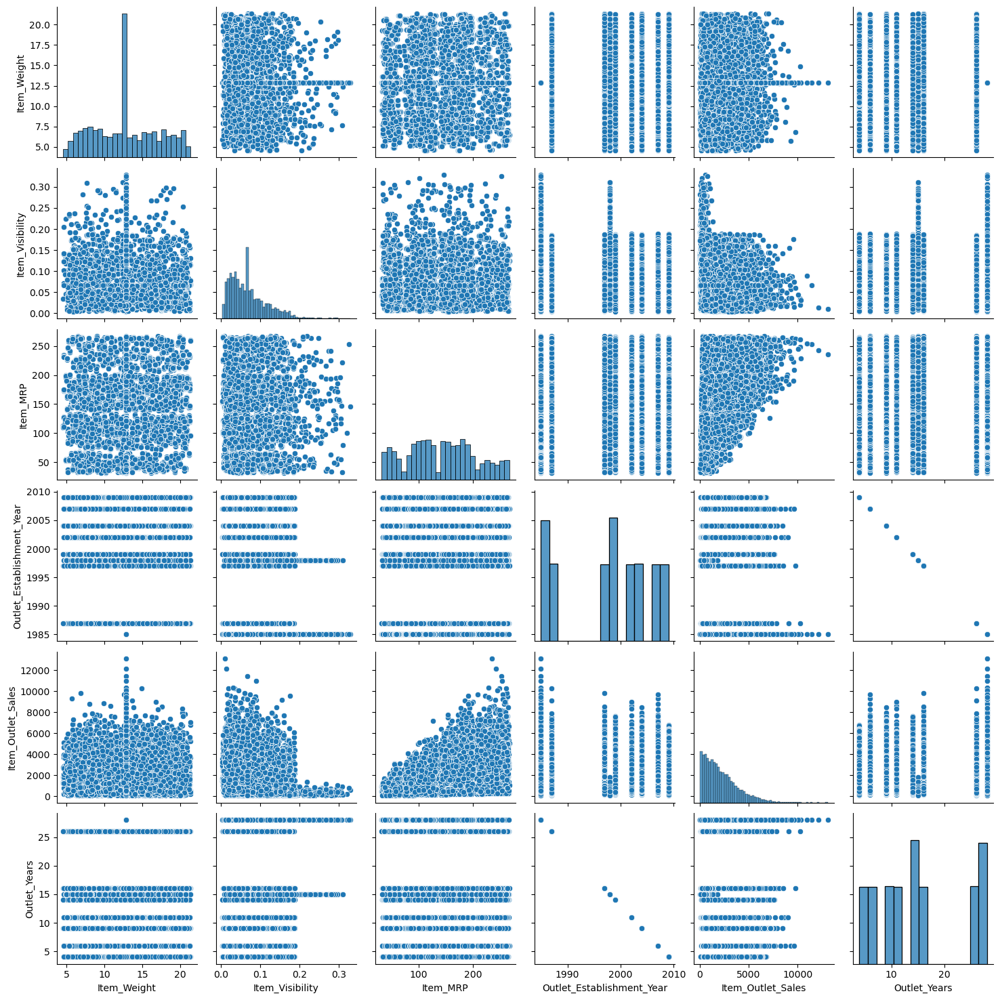

In [34]:
# Create a pairplot for the numeric columns
sns.pairplot(sales_df, vars=num_cols, diag_kind="hist")

### Outlier Analysis in numeric variables and their treatment.

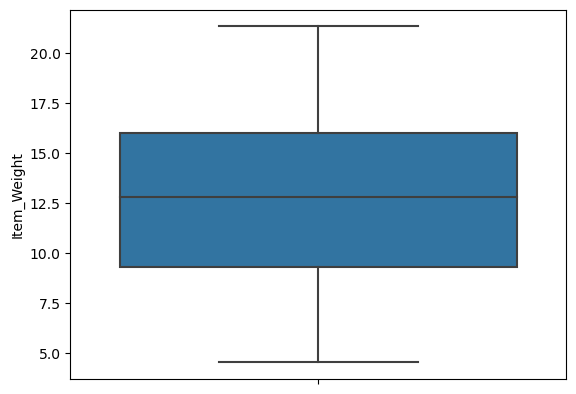

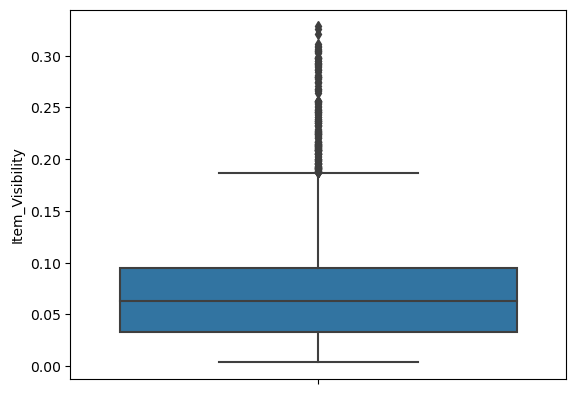

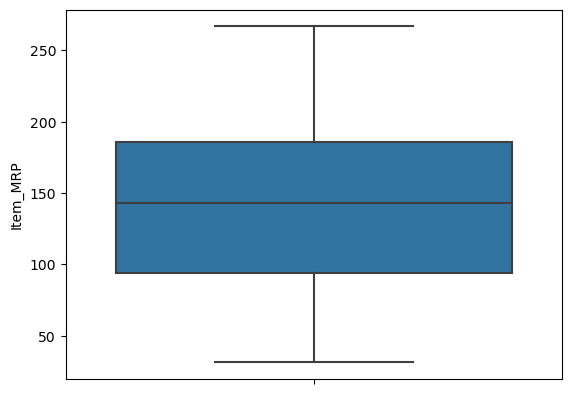

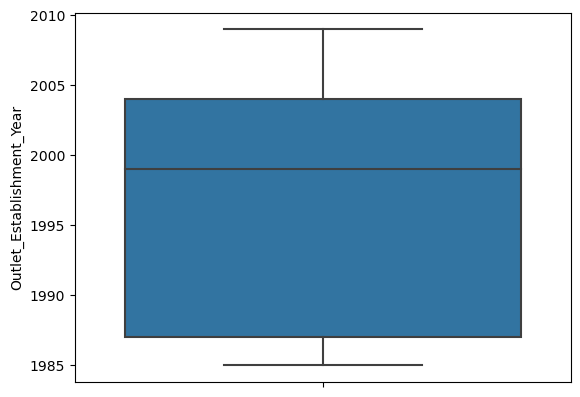

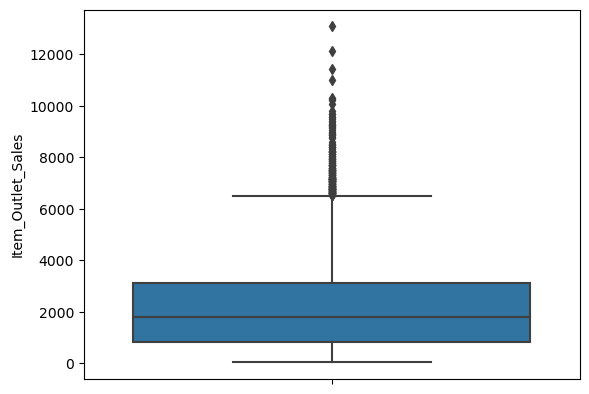

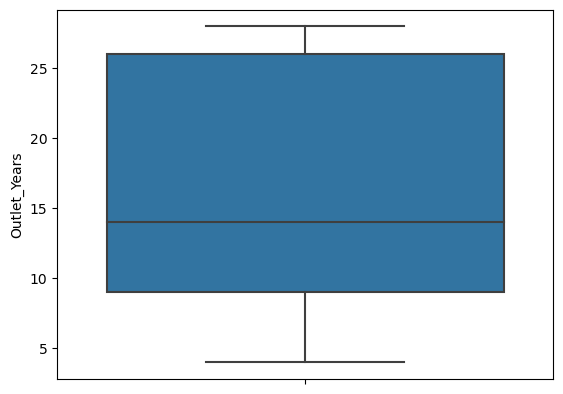

In [35]:
#Analysing Outliers in the numerical columns
for col in num_cols:
  plt.figure()
  sns.boxplot(y=col,data=sales_df)

In [36]:
#drop all the columns that doesn't need treatment for outliers
num_cols = num_cols.drop(['Item_Weight', 'Item_MRP', 'Outlet_Establishment_Year', 'Outlet_Years'])

print(num_cols)

Index(['Item_Visibility', 'Item_Outlet_Sales'], dtype='object')


In [37]:

# Treating the outliers in the two columns for more accurate prediction
for col in num_cols:
  quart1 = sales_df[col].quantile(0.25)
  quart3 = sales_df[col].quantile(0.75)
  iqr = quart3 - quart1
  lower_bound = quart1 - (1.5*iqr)
  upper_bound = quart3 + (1.5*iqr)
  sales_df = sales_df[sales_df[col]<upper_bound]
  sales_df = sales_df[sales_df[col]>lower_bound]


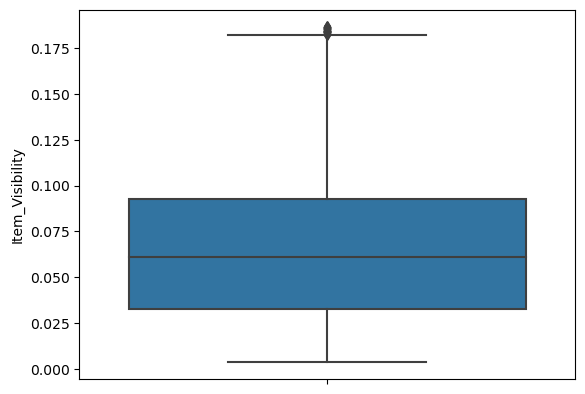

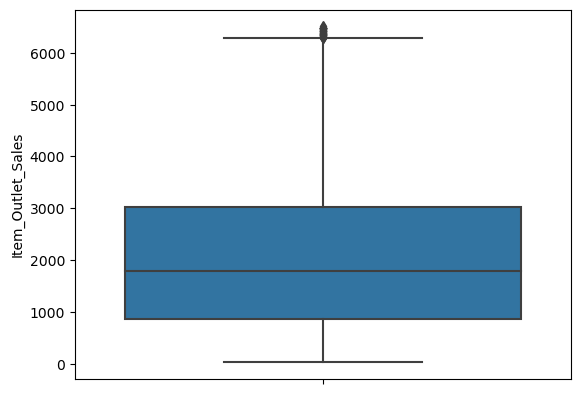

In [38]:
# Again checking Outliers after the treatment 
for col in num_cols:
  plt.figure()
  sns.boxplot(y=col,data=sales_df)

## Data Visualization

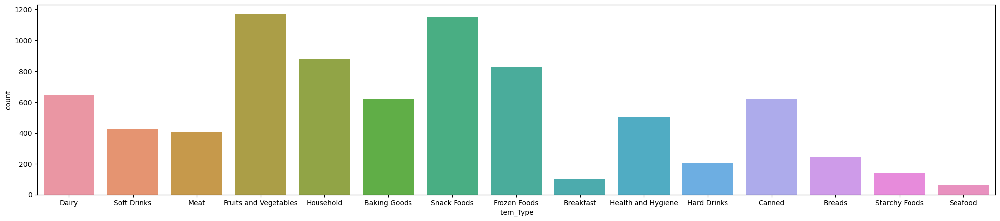

In [39]:
plt.figure(figsize=(25,5))
sns.countplot(x='Item_Type', data=sales_df)
plt.show()

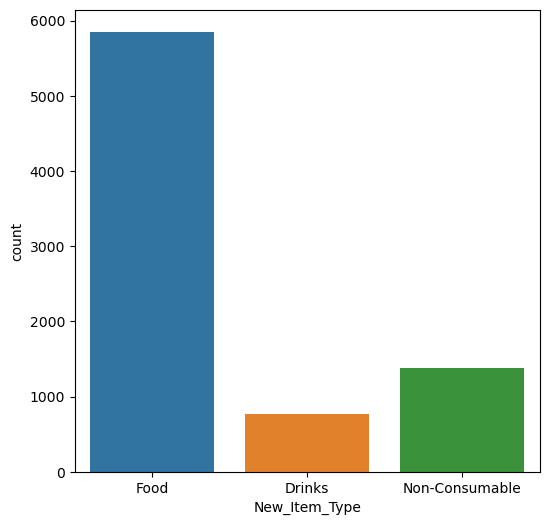

In [40]:
plt.figure(figsize=(6,6))
sns.countplot(x='New_Item_Type',data=sales_df)
plt.show()

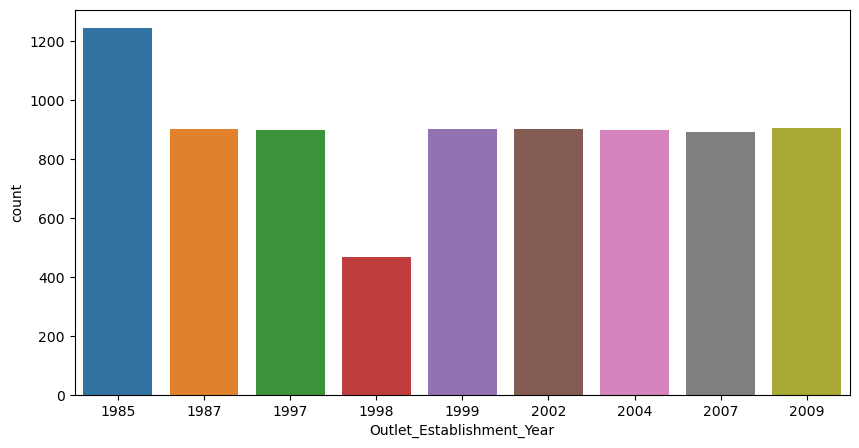

In [41]:

plt.figure(figsize=(10,5))
sns.countplot(x='Outlet_Establishment_Year',data=sales_df)
plt.show()

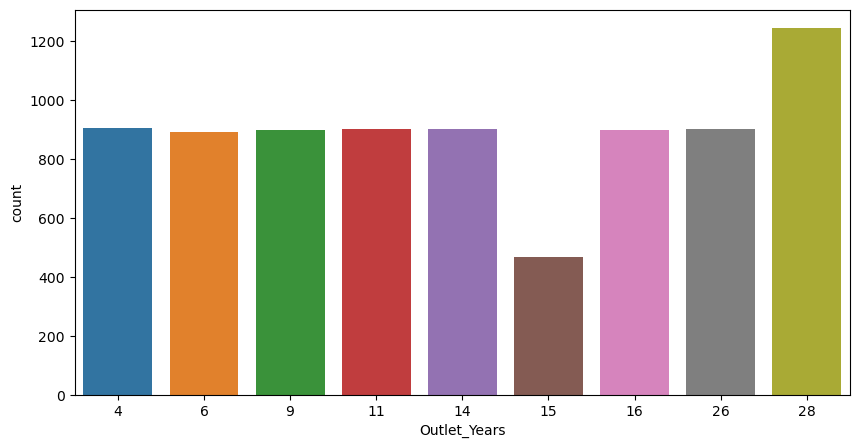

In [42]:
#Checking the Establishment operating years
plt.figure(figsize=(10,5))
sns.countplot(x='Outlet_Years',data=sales_df)
plt.show()

<AxesSubplot:xlabel='Item_Fat_Content', ylabel='count'>

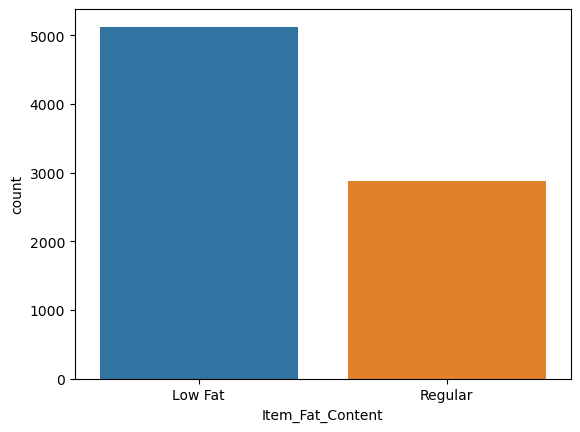

In [43]:

sns.countplot(x='Item_Fat_Content',data=sales_df)


<AxesSubplot:xlabel='Outlet_Location_Type', ylabel='count'>

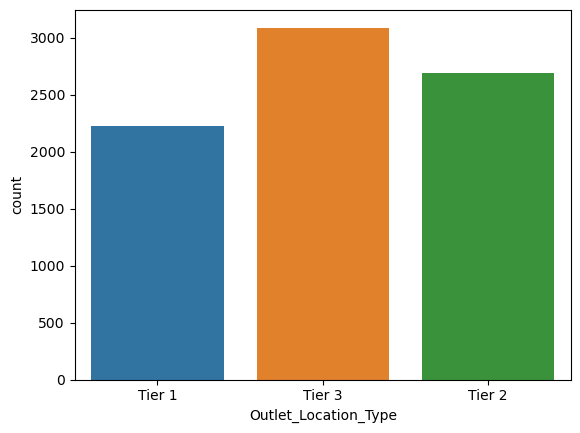

In [44]:

sns.countplot(x='Outlet_Location_Type',data=sales_df)


<AxesSubplot:xlabel='Outlet_Type', ylabel='count'>

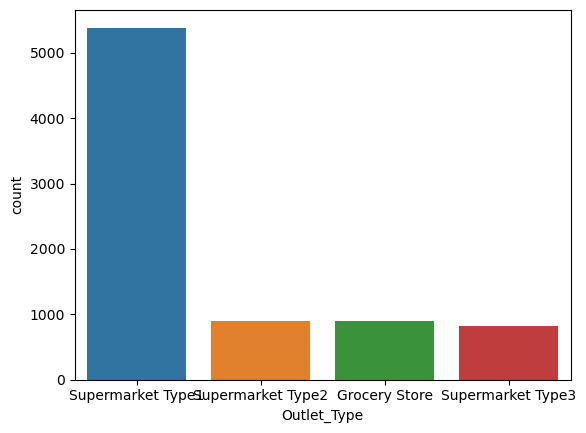

In [45]:

sns.countplot(x='Outlet_Type',data=sales_df)


<AxesSubplot:xlabel='Outlet_Size', ylabel='count'>

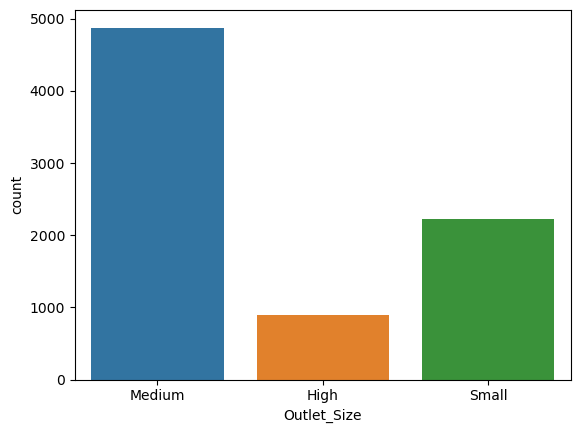

In [46]:

sns.countplot(x='Outlet_Size', data=sales_df)


<AxesSubplot:>

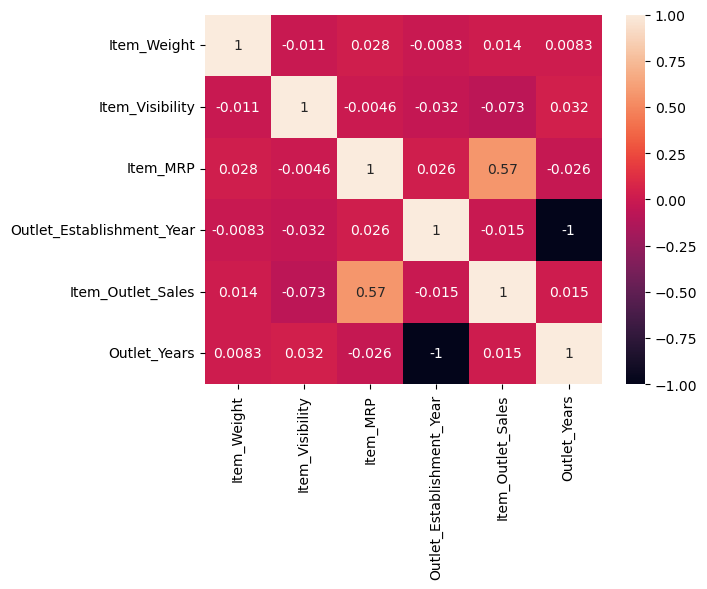

In [47]:
#Gives correlation of all the columns against the other
corr = sales_df.corr()
#Heatmap to show the correlation
sns.heatmap(corr, annot=True)

In [48]:
sales_df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,New_Item_Type,Outlet_Years
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,Food,14
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,Drinks,4
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700,Food,14
3,FDX07,19.20,Regular,0.066251,Fruits and Vegetables,182.0950,OUT010,1998,Medium,Tier 3,Grocery Store,732.3800,Food,15
4,NCD19,8.93,Low Fat,0.066251,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052,Non-Consumable,26


### Label Encoding

In [49]:
#dropping all unwanted features which are affecting accuracy
sales_df.drop(['Item_Identifier','Outlet_Establishment_Year','Item_Fat_Content','Item_Type'],inplace=True,axis=1)

In [50]:
# Select all the columns with object data type 
categorical_cols = sales_df.select_dtypes(include='object').columns
print(categorical_cols)

Index(['Outlet_Identifier', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type', 'New_Item_Type'],
      dtype='object')


In [51]:
#Label Encoding
le = LabelEncoder()

#Encoding Outlet_Identifier column just as "Outlet" column
sales_df['Outlet'] = le.fit_transform(sales_df['Outlet_Identifier'])
categorical_cols = categorical_cols.drop(['Outlet_Identifier'])

# Encoding each categorical column into numeric values for training with ML
for cols in categorical_cols:
    sales_df[cols] = le.fit_transform(sales_df[cols])


In [52]:
#One hot Encoding on only the categorical columns extracted previously
sales_df = pd.get_dummies(sales_df, columns=categorical_cols)
sales_df.head()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Identifier,Item_Outlet_Sales,Outlet_Years,Outlet,Outlet_Size_0,Outlet_Size_1,Outlet_Size_2,Outlet_Location_Type_0,Outlet_Location_Type_1,Outlet_Location_Type_2,Outlet_Type_0,Outlet_Type_1,Outlet_Type_2,Outlet_Type_3,New_Item_Type_0,New_Item_Type_1,New_Item_Type_2
0,9.30,0.016047,249.8092,OUT049,3735.1380,14,9,0,1,0,1,0,0,0,1,0,0,0,1,0
1,5.92,0.019278,48.2692,OUT018,443.4228,4,3,0,1,0,0,0,1,0,0,1,0,1,0,0
2,17.50,0.016760,141.6180,OUT049,2097.2700,14,9,0,1,0,1,0,0,0,1,0,0,0,1,0
3,19.20,0.066251,182.0950,OUT010,732.3800,15,0,0,1,0,0,0,1,1,0,0,0,0,1,0
4,8.93,0.066251,53.8614,OUT013,994.7052,26,1,1,0,0,0,0,1,0,1,0,0,0,0,1


## Training and Testing with Models

In [54]:
#Defining the input features and target vairable for training and testing

X = sales_df.drop(columns=['Outlet_Identifier', 'Item_Outlet_Sales'], axis=1)
y = sales_df['Item_Outlet_Sales']

In [55]:
X.head(10)

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Years,Outlet,Outlet_Size_0,Outlet_Size_1,Outlet_Size_2,Outlet_Location_Type_0,Outlet_Location_Type_1,Outlet_Location_Type_2,Outlet_Type_0,Outlet_Type_1,Outlet_Type_2,Outlet_Type_3,New_Item_Type_0,New_Item_Type_1,New_Item_Type_2
0,9.300000,0.016047,249.8092,14,9,0,1,0,1,0,0,0,1,0,0,0,1,0
1,5.920000,0.019278,48.2692,4,3,0,1,0,0,0,1,0,0,1,0,1,0,0
2,17.500000,0.016760,141.6180,14,9,0,1,0,1,0,0,0,1,0,0,0,1,0
3,19.200000,0.066251,182.0950,15,0,0,1,0,0,0,1,1,0,0,0,0,1,0
4,8.930000,0.066251,53.8614,26,1,1,0,0,0,0,1,0,1,0,0,0,0,1
5,10.395000,0.066251,51.4008,4,3,0,1,0,0,0,1,0,0,1,0,0,1,0
6,13.650000,0.012741,57.6588,26,1,1,0,0,0,0,1,0,1,0,0,0,1,0
7,12.837942,0.127470,107.7622,28,5,0,1,0,0,0,1,0,0,0,1,0,1,0
8,16.200000,0.016687,96.9726,11,7,0,1,0,0,1,0,0,1,0,0,0,1,0
9,19.200000,0.094450,187.8214,6,2,0,1,0,0,1,0,0,1,0,0,0,1,0


In [56]:
#Splitting the input and target variables into training and testing sets, both for training and predictions respectively
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

In [57]:
y.head()

0    3735.1380
1     443.4228
2    2097.2700
3     732.3800
4     994.7052
Name: Item_Outlet_Sales, dtype: float64

In [58]:
#Defining a function to better traing and evaluate the performance using multiple models.

def train_test_model(model, X_train, y_train, X_test, y_test):
    # Fit the model to the training data
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    #Evaluating the model with Mean Squared Error, Mean Absolute Error and R2 metrics
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = metrics.r2_score(y_test, y_pred)
    rmse = np.sqrt(mse)
    
    # Perform 5-fold cross-validation on the model
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring="neg_mean_squared_error")
    
    #Find the mean and standard deviation of the cross-validation metric
    cv_mean = np.abs(scores.mean())
    cv_std = scores.std()
    
    #Evaluation Report of the specific model
    print(f"-------Eval Report of {model}---------")
    print(f"\n\nMean Squared Error: {mse}")
    print(f"\nMean Absolute Error: {mae}")
    print(f"\nRoot Mean Squared Error: {rmse}")
    print(f"\nVariance: {r2}")
    print(f"\nMean of cross-validation score: {cv_mean}")
    print(f"\nStandard Deviation of cross-validation score: {cv_std}")
    
    #Visualizing the evaluation
    # Scatter plot of the test and predicted values
    fig = px.scatter(x=y_test, y=y_pred)
    fig.show()

    # Density plot of the difference between the test and predicted values
    fig = px.histogram(x=y_test-y_pred, nbins=50)
    fig.show()

In [59]:
#Training and testing using Linear Regression.
Linear_Regression = LinearRegression()
train_test_model(Linear_Regression, X_train, y_train, X_test, y_test)


-------Eval Report of LinearRegression()---------


Mean Squared Error: 998212.9713887769

Mean Absolute Error: 770.3144445642065

Root Mean Squared Error: 999.1060861534058

Variance: 0.575147725334456

Mean of cross-validation score: 1032776.8457883097

Standard Deviation of cross-validation score: 28916.082528605926


In [60]:
# Train and evaluate the random forest model
rf_model = RandomForestRegressor()
train_test_model(rf_model, X_train, y_train, X_test, y_test)

-------Eval Report of RandomForestRegressor()---------


Mean Squared Error: 1080426.6207736954

Mean Absolute Error: 756.2840967237499

Root Mean Squared Error: 1039.4357222905587

Variance: 0.5401565391338368

Mean of cross-validation score: 1073190.320951102

Standard Deviation of cross-validation score: 26681.154532359542


In [62]:
# Train and evaluate with the Gradient Boosting model
gbr_model = GradientBoostingRegressor()
train_test_model(gbr_model, X_train, y_train, X_test, y_test)

### Looking into the importances of the variables, doing that on our best performing model.

# Create a dataframe of the model feature importances
importances = pd.DataFrame({'feature': X_train.columns, 'importance': gbr_model.feature_importances_})

# Plot the feature importances as a bar plot
fig = px.bar(importances, x='feature', y='importance')
fig.show()


-------Eval Report of GradientBoostingRegressor()---------


Mean Squared Error: 926922.876664868

Mean Absolute Error: 705.7628232208295

Root Mean Squared Error: 962.7683400823212

Variance: 0.605489706227007

Mean of cross-validation score: 972311.9734461248

Standard Deviation of cross-validation score: 30360.049573722572
